# Start with the necessary imports

In [1]:
import torch_geometric.datasets as pyg_dataset
import qek.data.graphs as qek_graphs
from pathlib import Path
import qek.data.extractors as qek_extractors
from qek.shared.retrier import PygRetrier
from torch_geometric.utils import to_networkx
from utils import graph_to_mol
import qek.data.processed_data as qek_dataset
import matplotlib.pyplot as plt 


# First step: retreive the dataset that we'll work on : 

In [2]:
DATASET = PygRetrier().insist(pyg_dataset.TUDataset, root="dataset", name="PTC_FM")
display("Loaded %s samples" % (len(DATASET), ))

compiler = qek_graphs.PTCFMCompiler()
extractor = qek_extractors.QutipExtractor(
    path=Path("saved_data.json"),
    compiler=compiler
)
extractor.add_graphs(graphs=DATASET)
compiled = extractor.compile()
display("Compiled %s sequences" % (len(compiled), ))
processed_dataset = qek_dataset.load_dataset(file_path="ptcfm_processed_dataset.json")

'Loaded 349 samples'

graph # 2 is not embeddable, skipping
graph # 17 is not embeddable, skipping
graph # 24 is not embeddable, skipping
graph # 26 is not embeddable, skipping
graph # 27 is not embeddable, skipping
graph # 35 is not embeddable, skipping
graph # 41 is not embeddable, skipping
graph # 44 is not embeddable, skipping
graph # 59 is not embeddable, skipping
graph # 61 is not embeddable, skipping
graph # 63 is not embeddable, skipping
graph # 66 is not embeddable, skipping
graph # 87 is not embeddable, skipping
graph # 102 is not embeddable, skipping
graph # 105 is not embeddable, skipping
graph # 108 is not embeddable, skipping
graph # 116 is not embeddable, skipping
graph # 119 is not embeddable, skipping
graph # 123 is not embeddable, skipping
graph # 127 is not embeddable, skipping
graph # 129 is not embeddable, skipping
graph # 130 is not embeddable, skipping
graph # 133 is not embeddable, skipping
graph # 136 is not embeddable, skipping
graph # 156 is not embeddable, skipping
graph # 167 is

/Users/mehdidjellabi/Desktop/summer_lab/.venv/lib/python3.12/site-packages/pulser/register/register.py:58: DeprecationWarning: Usage of `int`s or any non-`str`types as `QubitId`s will be deprecated. Define your `QubitId`s as `str`s, prefer setting `prefix='q'` when using classmethods, as that will become the new default once `int` qubit IDs become invalid.
  super().__init__(qubits, **kwargs)
/Users/mehdidjellabi/Desktop/summer_lab/.venv/lib/python3.12/site-packages/pulser/register/register.py:58: DeprecationWarning: Usage of `int`s or any non-`str`types as `QubitId`s will be deprecated. Define your `QubitId`s as `str`s, prefer setting `prefix='q'` when using classmethods, as that will become the new default once `int` qubit IDs become invalid.
  super().__init__(qubits, **kwargs)
/Users/mehdidjellabi/Desktop/summer_lab/.venv/lib/python3.12/site-packages/pulser/register/register.py:58: DeprecationWarning: Usage of `int`s or any non-`str`types as `QubitId`s will be deprecated. Define yo

'Compiled 285 sequences'

# What are these molecules ? 

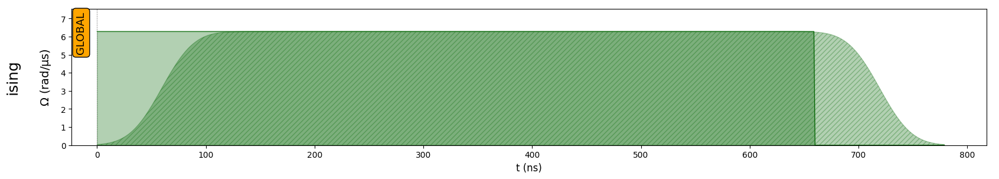

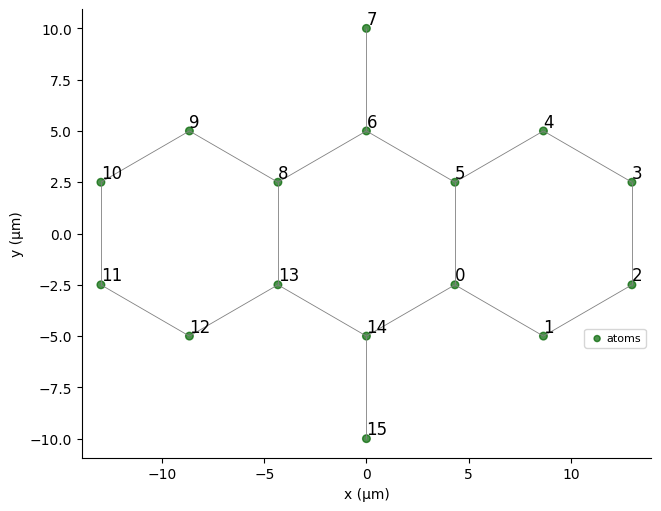

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


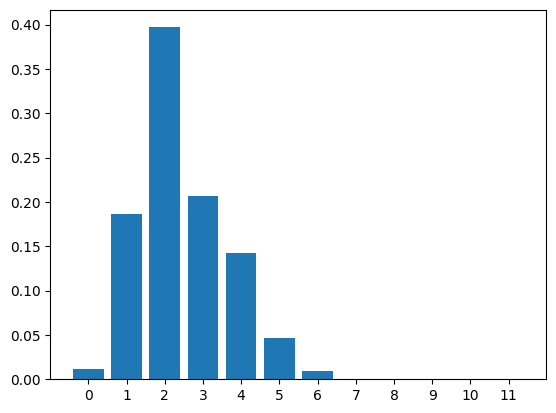

In [ ]:
extracted_graphs_idx = [compiled[i].graph.id-1 for i in range(len(compiled))]
idx = 2
compiled[idx].sequence.draw()
compiled[idx].sequence.register.draw(blockade_radius = 5.2)
processed_dataset[idx].draw_excitation()


In [5]:
max_qubits = 15
processed_dataset = extractor.run(max_qubits).processed_data
display("Extracted features from %s samples"% (len(processed_dataset)))

Graph <built-in function id> exceeds the qubit limit specified in QutipExtractor (20 > 15), skipping
Graph <built-in function id> exceeds the qubit limit specified in QutipExtractor (16 > 15), skipping
Graph <built-in function id> exceeds the qubit limit specified in QutipExtractor (19 > 15), skipping
Graph <built-in function id> exceeds the qubit limit specified in QutipExtractor (16 > 15), skipping
Graph <built-in function id> exceeds the qubit limit specified in QutipExtractor (18 > 15), skipping
Graph <built-in function id> exceeds the qubit limit specified in QutipExtractor (22 > 15), skipping
Graph <built-in function id> exceeds the qubit limit specified in QutipExtractor (16 > 15), skipping
Graph <built-in function id> exceeds the qubit limit specified in QutipExtractor (21 > 15), skipping
Graph <built-in function id> exceeds the qubit limit specified in QutipExtractor (19 > 15), skipping
Graph <built-in function id> exceeds the qubit limit specified in QutipExtractor (17 > 15),

/Users/mehdidjellabi/Desktop/summer_lab/.venv/lib/python3.12/site-packages/pulser/register/register.py:552: UserWarning: Register serialization to an abstract representation irreversibly converts all qubit ID's to strings.
  names = stringify_qubit_ids(self._ids)


processed data saved to saved_data.json


'Extracted features from 208 samples'

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


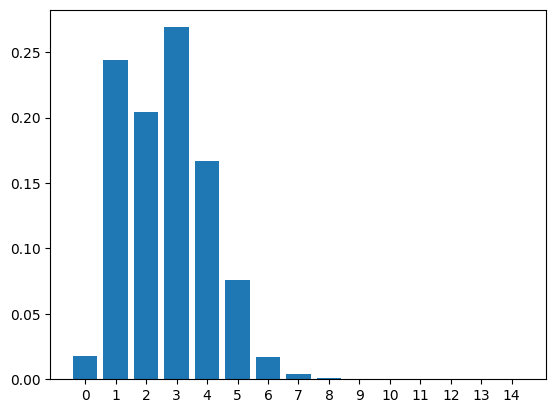

In [ ]:
processed_dataset[100].draw_excitation()

# The Machine Learning part 

### First a little bit of visualization 

In [6]:
import numpy as np
dists = [processed_dataset[i]._dist_excitation for i in range(len(processed_dataset))]

max_len = max(a.size for a in dists)
dtype   = np.result_type(*[a.dtype for a in dists])

padded_dists = np.zeros((len(dists), max_len), dtype=dtype)
for i, a in enumerate(dists):
    padded_dists[i, :a.size] = a



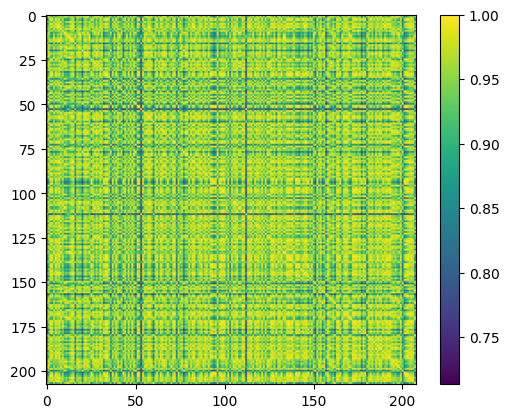

In [36]:
from scipy.spatial.distance import jensenshannon as JS

N = padded_dists.shape[0]
js_matrix = np.zeros((N, N))
for i in range(N):
    for j in range(i + 1,N,):  # each i,i element has a 0 vlaue for JS divergence and JS is symetric
        js_matrix[i, j] = JS(padded_dists[i], padded_dists[j]) ** 2
js_matrix += js_matrix.transpose()
js_matrix = np.exp(-0.5*js_matrix)

plt.imshow(js_matrix)
plt.colorbar()
plt.show()

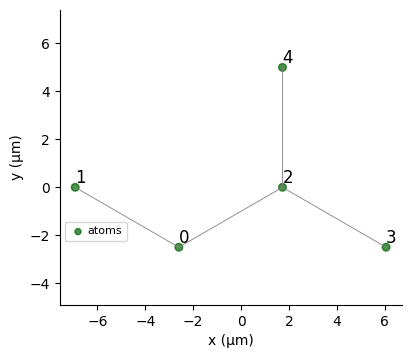

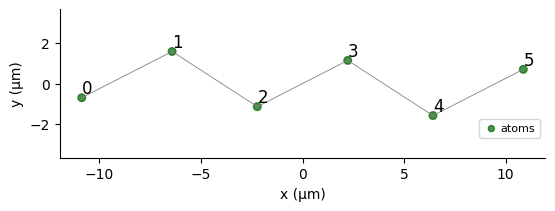

In [46]:

I ,J =np.where(js_matrix > 1-1e-2)
structurally_close = [(I[u].item(),J[u].item()) for u in range(I.shape[0]) if I[u] != J[u] ]

u,v = structurally_close[10]
processed_dataset[u].draw_register()

processed_dataset[v].draw_register()


In [48]:
js_matrix[u,v]

np.float64(0.9935093981611062)

Toxic


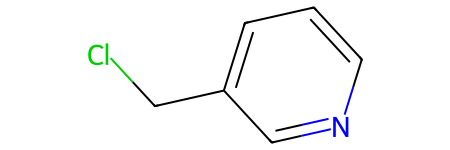

Toxic


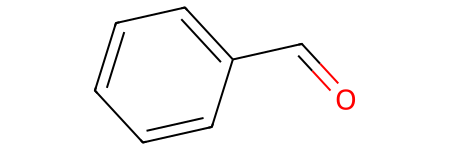

Toxic


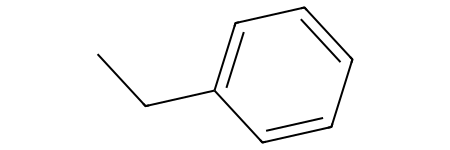

non toxic


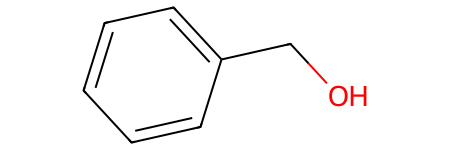

Toxic


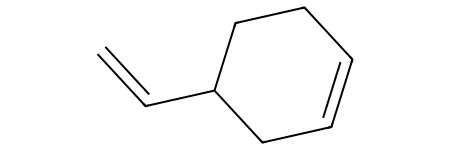

non toxic


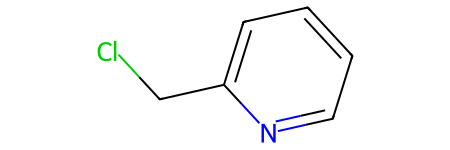

non toxic


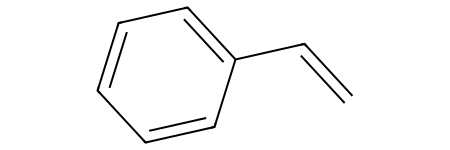

In [9]:

compiled_coord = dict()
for i in range(len(compiled)):
    coords = np.array(compiled[i].sequence._register._coords)
    diff = coords[:, None, :] - coords[None, :, :]
    dist_mat = np.linalg.norm(diff, axis=-1)
    compiled_coord[i] = sorted(dist_mat.ravel().tolist())

processed_coords = dict()
for i,data_pt in enumerate(processed_dataset):
    coords = np.array(data_pt._sequence._register._coords)
    diff = coords[:, None, :] - coords[None, :, :]
    dist_mat = np.linalg.norm(diff, axis=-1)
    processed_coords[i] = sorted(dist_mat.ravel().tolist())
    
correspondence = { i : [j  for j in compiled_coord if compiled_coord[j] == processed_coords[i] ] for i in processed_coords}

molecules = {idx : graph_to_mol(to_networkx(compiled[idx].graph.pyg,node_attrs=["x"],
                                            edge_attrs=["edge_attr"],
                                            to_undirected=True))
                                            for idx in compiled_coord}

for v in correspondence[u]:
    print("Toxic" if compiled[v].graph.pyg.y.item() else "non toxic")
    display(molecules[v])

### Now let's train a model 

In [ ]:
from qek.kernel import FastQEK as QEK
from sklearn.model_selection import train_test_split

# Prepare features (X) and targets (y)
X = [data for data in processed_dataset] # Quantum distribution excitation.
y = [data.target for data in processed_dataset] # Toxicity.

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size=0.2, random_state=42)
print(f'Size of the training quantum compatible dataset = {len(X_train)}')
print(f'Size of the testing quantum compatible dataset = {len(X_test)}')

# Initialize the Quantum Evolution Kernel with a parameter mu
QEK_kernel = QEK(mu=0.5)


Size of the training quantum compatible dataset = 166
Size of the testing quantum compatible dataset = 42


In [11]:
from sklearn.svm import SVC

model = SVC(kernel=QEK_kernel, random_state=42)
print("Default value of the C parameter of the SVM: ", model.C)
print("Default value of the mu parameter for the JS: ", QEK_kernel._params['mu'])

model.fit(X_train, y_train)

Default value of the C parameter of the SVM:  1.0
Default value of the mu parameter for the JS:  0.5


,C,1.0
,kernel,<qek.kernel.k...t 0x1694e9940>
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


In [12]:
import numpy as np
from sklearn.metrics import classification_report, f1_score, balanced_accuracy_score

def evaluate_predictions(y_test, y_pred):
    """
    Evaluates the model predictions using multiple metrics: F1 score, and
    balanced accuracy. Prints the classification report 
    and other evaluation results.

    Args:
        y_test (array-like): The true labels.
        y_pred (array-like): The predicted labels.
    """
    # Calculate F1 score and balanced accuracy
    max_f1_score = f1_score(y_test, y_pred, average='weighted')
    final_f1_std = np.std(f1_score(y_test, y_pred, average=None))
    max_bal_acc = balanced_accuracy_score(y_test, y_pred)
    std_bal_acc = np.std(balanced_accuracy_score(y_test, y_pred))

    # Print the evaluation results
    print("\nEvaluation Results:")
    print(f"F1 Score: {max_f1_score:.2f}")
    print(f"Standard Deviation of F1 Score: {final_f1_std:.2f}")
    print(f"Balanced Accuracy: {max_bal_acc:.2f}")
    print(f"Standard Deviation of Balanced Accuracy: {std_bal_acc:.2f}")

    # Print classification report
    print("Classification Report:")
    print(classification_report(y_test, y_pred))


In [13]:
# Making predictions using the trained model
y_pred = model.predict(X_test)

evaluate_predictions(y_test, y_pred)



Evaluation Results:
F1 Score: 0.52
Standard Deviation of F1 Score: 0.23
Balanced Accuracy: 0.54
Standard Deviation of Balanced Accuracy: 0.00
Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.92      0.72        24
           1       0.60      0.17      0.26        18

    accuracy                           0.60        42
   macro avg       0.60      0.54      0.49        42
weighted avg       0.60      0.60      0.52        42



### To go a bit further : hyperparameter tuning 

In [14]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline

# Define the pipeline
pipeline = Pipeline([
    ('QEK', QEK(mu=0.5)),
    ('svm', SVC(kernel='precomputed', random_state=42))
])
pipeline.fit(X_train, y_train)

/Users/mehdidjellabi/Desktop/summer_lab/.venv/lib/python3.12/site-packages/sklearn/utils/_tags.py:338: DeprecationWarning: The following error was raised: 'FastQEK' object has no attribute '__sklearn_tags__'. It seems that there are no classes that implement `__sklearn_tags__` in the MRO and/or all classes in the MRO call `super().__sklearn_tags__()`. Make sure to inherit from `BaseEstimator` which implements `__sklearn_tags__` (or alternatively define `__sklearn_tags__` but we don't recommend this approach). Note that `BaseEstimator` needs to be on the right side of other Mixins in the inheritance order. The default are now used instead since retrieving tags failed. This warning will be replaced by an error in 1.8.
  warnings.warn(
/Users/mehdidjellabi/Desktop/summer_lab/.venv/lib/python3.12/site-packages/sklearn/utils/_tags.py:338: DeprecationWarning: The following error was raised: 'FastQEK' object has no attribute '__sklearn_tags__'. It seems that there are no classes that implemen

,steps,"[('QEK', ...), ('svm', ...)]"
,transform_input,None
,memory,None
,verbose,False
,C,1.0
,kernel,'precomputed'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False


In [15]:
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold
from sklearn.metrics import make_scorer

# Define scoring metrics
scoring = {
    "balanced_accuracy": make_scorer(balanced_accuracy_score),
    "f1_score": make_scorer(f1_score, average="weighted")
}

# Define cross-validation strategy
skf = RepeatedStratifiedKFold(n_splits=5, n_repeats=10, random_state=42)

# Define parameter grid
param_grid = {
    'svm__C': np.logspace(0.001, 1, 5),
    'QEK__mu': [0.25, 0.5, 0.75],
}

grid_search = GridSearchCV(pipeline, param_grid, scoring=scoring, cv=skf, refit="f1_score", n_jobs=8, return_train_score=True)

In [16]:
grid_search.fit(X_train, y_train)
# Evaluate the best model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)


/Users/mehdidjellabi/Desktop/summer_lab/.venv/lib/python3.12/site-packages/sklearn/utils/_tags.py:338: DeprecationWarning: The following error was raised: 'FastQEK' object has no attribute '__sklearn_tags__'. It seems that there are no classes that implement `__sklearn_tags__` in the MRO and/or all classes in the MRO call `super().__sklearn_tags__()`. Make sure to inherit from `BaseEstimator` which implements `__sklearn_tags__` (or alternatively define `__sklearn_tags__` but we don't recommend this approach). Note that `BaseEstimator` needs to be on the right side of other Mixins in the inheritance order. The default are now used instead since retrieving tags failed. This warning will be replaced by an error in 1.8.
  warnings.warn(
/Users/mehdidjellabi/Desktop/summer_lab/.venv/lib/python3.12/site-packages/sklearn/utils/_tags.py:338: DeprecationWarning: The following error was raised: 'FastQEK' object has no attribute '__sklearn_tags__'. It seems that there are no classes that implemen

In [17]:
print("toxic classified as non toxic :",list(y_pred-y_test).count(1))
print("non toxic classified as toxic :",list(y_pred-y_test).count(-1))
print("correctly classified :",list(y_pred-y_test).count(-1))
evaluate_predictions(y_test, y_pred)


toxic classified as non toxic : 7
non toxic classified as toxic : 8
correctly classified : 8

Evaluation Results:
F1 Score: 0.64
Standard Deviation of F1 Score: 0.06
Balanced Accuracy: 0.63
Standard Deviation of Balanced Accuracy: 0.00
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.71      0.69        24
           1       0.59      0.56      0.57        18

    accuracy                           0.64        42
   macro avg       0.63      0.63      0.63        42
weighted avg       0.64      0.64      0.64        42



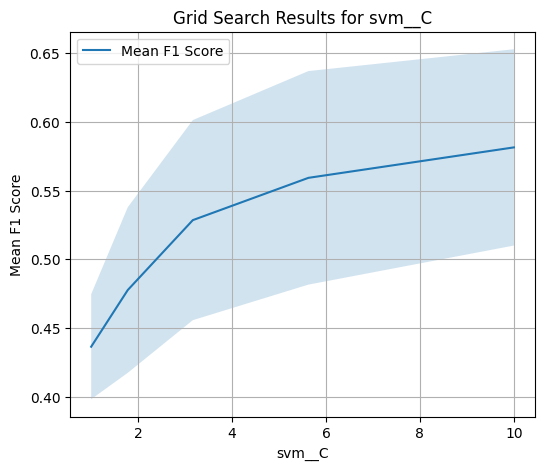

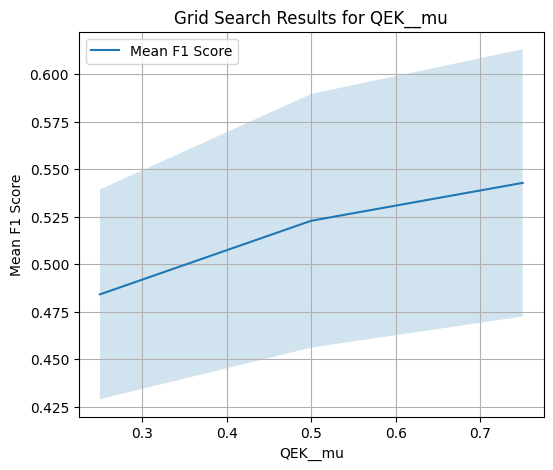

In [21]:
# Simple plot function to plot results
def plot_grid_search_results(grid_search, param_name="svm__C"):
    cv_results = grid_search.cv_results_
    param_values = [p[param_name] for p in cv_results['params']]
    unique_param_values = sorted(set(param_values))

    mean_f1_scores = []
    std_f1_scores = []

    for param_value in unique_param_values:
        indices = [i for i, p in enumerate(cv_results['params']) if p[param_name] == param_value]
        mean_f1_scores.append(np.mean([cv_results['mean_test_f1_score'][i] for i in indices]))
        std_f1_scores.append(np.mean([cv_results['std_test_f1_score'][i] for i in indices]))

    plt.figure(figsize=(6, 5))
    plt.plot(unique_param_values, mean_f1_scores, label="Mean F1 Score")
    plt.fill_between(unique_param_values, 
                     np.array(mean_f1_scores) - np.array(std_f1_scores),
                     np.array(mean_f1_scores) + np.array(std_f1_scores), 
                     alpha=0.2)
    
    plt.title(f"Grid Search Results for {param_name}")
    plt.xlabel(f"{param_name}")
    plt.ylabel("Mean F1 Score")
    plt.legend()
    plt.grid(True)
    plt.show()

plot_grid_search_results(grid_search, 'svm__C')

plot_grid_search_results(grid_search, 'QEK__mu')

In [19]:
processed_dataset[v].__dict__

{'_sequence': <pulser.sequence.sequence.Sequence at 0x1690d0860>,
 'state_dict': {'00000000000101': 18,
  '00000000000100': 19,
  '00010000000001': 1,
  '00000000000000': 236,
  '01000010001001': 1,
  '00101010000000': 8,
  '10000000000001': 4,
  '00000000010101': 15,
  '00010000000000': 12,
  '00000100001001': 2,
  '00000000010000': 17,
  '01010000000000': 9,
  '00100010000000': 11,
  '00100000100010': 5,
  '00010101000000': 8,
  '00000010001001': 2,
  '00000101000000': 17,
  '00100000000000': 28,
  '00000000100000': 22,
  '00010100000000': 12,
  '00000000001010': 5,
  '00000000110000': 1,
  '10100000001001': 1,
  '00100100000000': 7,
  '00101010101010': 1,
  '00001001000000': 15,
  '00000000100100': 9,
  '01010001101000': 3,
  '00010010000000': 20,
  '01000000100010': 3,
  '01000000001010': 2,
  '00010000010100': 1,
  '01000010000000': 3,
  '00000001000000': 10,
  '00101010010010': 2,
  '10010001000000': 7,
  '01000001000000': 6,
  '00000000010100': 11,
  '00000100000000': 17,
  '010